In [ ]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


import xml.etree.cElementTree as ET
import glob
import os
import json
import random
import shutil

from PIL import Image, ImageOps

In [ ]:
# Tagged data in XML format
with open('/content/face-mask-detection/annotations/maksssksksss0.xml') as f:
    contents = f.read()
    print(contents)



<annotation>

    <folder>images</folder>

    <filename>maksssksksss0.png</filename>

    <size>

        <width>512</width>

        <height>366</height>

        <depth>3</depth>

    </size>

    <segmented>0</segmented>

    <object>

        <name>without_mask</name>

        <pose>Unspecified</pose>

        <truncated>0</truncated>

        <occluded>0</occluded>

        <difficult>0</difficult>

        <bndbox>

            <xmin>79</xmin>

            <ymin>105</ymin>

            <xmax>109</xmax>

            <ymax>142</ymax>

        </bndbox>

    </object>

    <object>

        <name>with_mask</name>

        <pose>Unspecified</pose>

        <truncated>0</truncated>

        <occluded>0</occluded>

        <difficult>0</difficult>

        <bndbox>

            <xmin>185</xmin>

            <ymin>100</ymin>

            <xmax>226</xmax>

            <ymax>144</ymax>

        </bndbox>

    </object>

    <object>

        <name>without_mask</name>

        <pose>Uns

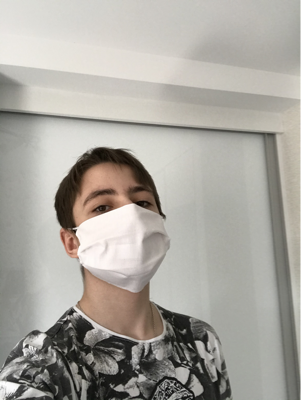

In [ ]:
# A visual from inside the data set
Image.open("/content/face-mask-detection/images/maksssksksss17.png")

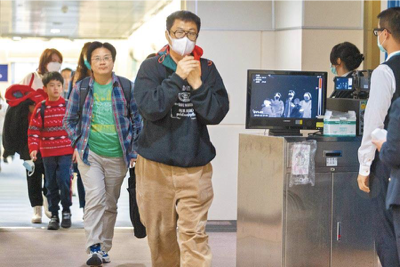

In [ ]:
# A visual from inside the data set
Image.open("/content/face-mask-detection/images/maksssksksss179.png")

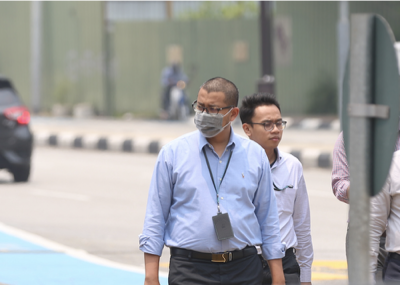

In [ ]:
# A visual from inside the data set
Image.open("/content/face-mask-detection/images/maksssksksss38.png")

In [ ]:
# Converting XML format data to TXT format
def xml_to_yolo_bbox(bbox, w, h):
    # xmin, ymin, xmax, ymax
    x_center = ((bbox[2] + bbox[0]) / 2) / w
    y_center = ((bbox[3] + bbox[1]) / 2) / h

    width = (bbox[2] - bbox[0]) / w
    height = (bbox[3] - bbox[1]) / h

    return [x_center, y_center, width, height]

def yolo_to_xml_bbox(bbox, w, h):
    # x_center, y_center, width, height
    w_half_len = (bbox[2] * w) / 2
    h_half_len = (bbox[3] * h) / 2

    xmin = int((bbox[0] * w) - w_half_len)
    ymin = int((bbox[1] * h) - h_half_len)
    xmax = int((bbox[0] * w) + w_half_len)
    ymax = int((bbox[1] * h) + h_half_len)

    return [xmin, ymin, xmax, ymax]

classes = ["without_mask", "with_mask", "mask_weared_incorrect"]

input_dir = "/content/face-mask-detection/annotations"
output_dir = "/content/labels"
image_dir = "/content/face-mask-detection/images"


if not os.path.isdir(output_dir):
    os.mkdir(output_dir)

import glob

files = glob.glob(os.path.join(input_dir, "*.xml"))
for fil in files:
    basename = os.path.basename(fil)
    filename = os.path.splitext(basename)[0]
    if not os.path.exists(os.path.join(image_dir, f"{filename}.png")):
        print(f"{filename} image does not exist!")
        continue

    result = []

    # Parse the content of the xml file
    tree = ET.parse(fil)
    root = tree.getroot()
    width = int(root.find("size").find("width").text)
    height = int(root.find("size").find("height").text)

    for obj in root.findall("object"):
        label = obj.find("name").text

        # check for new classes and append to list
            classes.append(label)
        index = classes.index(label)
        pil_bbox = [int(x.text) for x in obj.find("bndbox")]
        yolo_bbox = xml_to_yolo_bbox(pil_bbox, width, height)

        # convert data to string
        bbox_string = " ".join([str(x) for x in yolo_bbox])
        result.append(f"{index} {bbox_string}")

    if result:
        # generate a yolo format text file for each xml file
        with open(os.path.join(output_dir, f"{filename}.txt"), "w", encoding = "utf-8") as f:
            f.write("\n".join(result))
# generate the classes file as reference
with open("/content/classes.txt", "w", encoding = "utf-8") as f:
    f.write(json.dumps(classes))

In [ ]:
# Labels in the data set
with open('/content/classes.txt') as f:
    contents = f.read()
    print(contents)

["without_mask", "with_mask", "mask_weared_incorrect"]


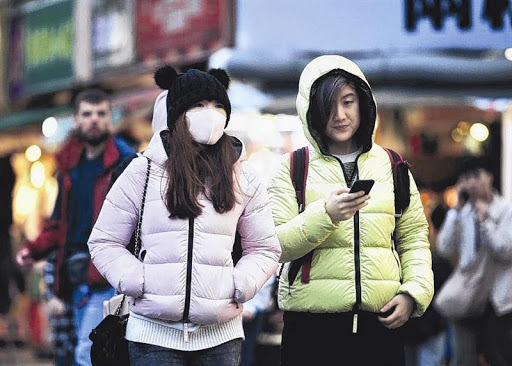

In [ ]:
# An image in the Data Set
Image.open("/content/face-mask-detection/images/maksssksksss0.png")

In [ ]:
# XML format tag of the image above
with open('/content/face-mask-detection/annotations/maksssksksss0.xml') as f:
    contents = f.read()
    print(contents)



<annotation>

    <folder>images</folder>

    <filename>maksssksksss0.png</filename>

    <size>

        <width>512</width>

        <height>366</height>

        <depth>3</depth>

    </size>

    <segmented>0</segmented>

    <object>

        <name>without_mask</name>

        <pose>Unspecified</pose>

        <truncated>0</truncated>

        <occluded>0</occluded>

        <difficult>0</difficult>

        <bndbox>

            <xmin>79</xmin>

            <ymin>105</ymin>

            <xmax>109</xmax>

            <ymax>142</ymax>

        </bndbox>

    </object>

    <object>

        <name>with_mask</name>

        <pose>Unspecified</pose>

        <truncated>0</truncated>

        <occluded>0</occluded>

        <difficult>0</difficult>

        <bndbox>

            <xmin>185</xmin>

            <ymin>100</ymin>

            <xmax>226</xmax>

            <ymax>144</ymax>

        </bndbox>

    </object>

    <object>

        <name>without_mask</name>

        <pose>Uns

In [ ]:
# TXT version of the above label in XML format
with open('/content/labels/maksssksksss0.txt') as f:
    contents = f.read()
    print(contents)

0 0.18359375 0.337431693989071 0.05859375 0.10109289617486339

1 0.4013671875 0.3333333333333333 0.080078125 0.12021857923497267

0 0.6689453125 0.3155737704918033 0.068359375 0.13934426229508196


In [ ]:
# Names and creation of files prepared for YoloV8
if os.path.isfile("/content/data/"):
    print("Dosya mevcut! (There is folder!)")
else:
    os.mkdir("/content/data/")
    os.mkdir('/content/data/train')
    os.mkdir('/content/data/val')
    os.mkdir('/content/data/test')
    os.mkdir('/content/data/train/images')
    os.mkdir('/content/data/train/labels')
    os.mkdir('/content/data/test/images')
    os.mkdir('/content/data/test/labels')
    os.mkdir('/content/data/val/images')
    os.mkdir('/content/data/val/labels')

In [ ]:
# Listing the names of image data together
metarial = []

for i in os.listdir("/content/face-mask-detection/images"):
    srt = i[:-4]
    metarial.append(srt)

In [ ]:
# Initial data of Merarial list
metarial[0:10]

['maksssksksss228',
 'maksssksksss8',
 'maksssksksss832',
 'maksssksksss490',
 'maksssksksss179',
 'maksssksksss217',
 'maksssksksss16',
 'maksssksksss424',
 'maksssksksss379',
 'maksssksksss138']

In [ ]:
# Data set creation function
def preparinbdata(main_txt_file, main_img_file, train_size, test_size, val_size):

    for i in range(0,train_size):

        source_txt = main_txt_file + "/" + metarial[i] + ".txt"
        source_img = main_img_file + "/" + metarial[i] + ".png"

        mstring = metarial[i]
        train_destination_txt = "/content/data/train/labels" + "/" + metarial[i] + ".txt"
        train_destination_png = "/content/data/train/images" + "/" + metarial[i] + ".png"

        shutil.copy(source_txt, train_destination_txt)
        shutil.copy(source_img, train_destination_png)

        #metarial.remove(file_name[:-4])


    for l in range(train_size , train_size + test_size):

        source_txt = main_txt_file + "/" + metarial[l] + ".txt"
        source_img = main_img_file + "/" + metarial[l] + ".png"

        mstring = metarial[l]
        test_destination_txt = "/content/data/test/labels" + "/" + metarial[l] + ".txt"
        test_destination_png = "/content/data/test/images" + "/" + metarial[l] + ".png"

        shutil.copy(source_txt, test_destination_txt)
        shutil.copy(source_img, test_destination_png)

        #metarial.remove(file_name[:-4])


    for n in range(train_size + test_size , train_size + test_size + val_size):

        source_txt = main_txt_file + "/" + metarial[n] + ".txt"
        source_img = main_img_file + "/" + metarial[n] + ".png"

        mstring = metarial[n]
        val_destination_txt = "/content/data/val/labels" + "/" + metarial[n] + ".txt"
        val_destination_png = "/content/data/val/images" + "/" + metarial[n] + ".png"

        shutil.copy(source_txt, val_destination_txt)
        shutil.copy(source_img, val_destination_png)

        #metarial.remove(file_name[:-4])

In [ ]:
# I'm streaming data
preparinbdata("/content/labels", "/content/face-mask-detection/images", 603, 150, 100)

In [ ]:
# configure .yaml file to guide the model for training
%cd /content/data

yaml_text = """train: /content/data/train/images
val: /content/data/val/images

nc: 3
names: ["without_mask", "with_mask", "mask_weared_incorrect"]"""

with open("/content/data/data.yaml", 'w') as file:
    file.write(yaml_text)

%cat data/data.yaml

/content/data

cat: data/data.yaml: No such file or directory


In [ ]:
# We install the 'ultralytics' library to use the YoloV8 library
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.178 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Setup complete ✅ (2 CPUs, 12.7 GB RAM, 27.4/78.2 GB disk)


In [ ]:
# /content/data
if os.path.isfile("/content/Result/"):
    print("Dosya mevcut! (There is folder!)")
else:
    os.mkdir("/content/Result/")

%cd /content/Result/


!yolo train model=yolov8n.pt data=/content/data/data.yaml epochs=50 imgsz=640

/content/Result


100% 6.23M/6.23M [00:00<00:00, 82.7MB/s]

Ultralytics YOLOv8.0.178 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/data/data.yaml, epochs=50, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks

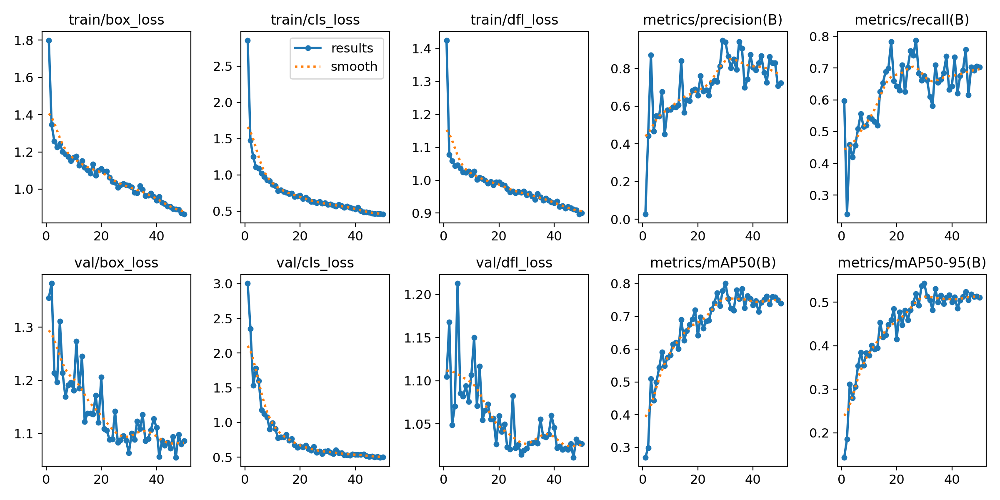

In [ ]:
# The result of my training
Image.open("/content/Result/runs/detect/train/results.png")

In [ ]:

!yolo predict model=/content/Result/runs/detect/train/weights/best.pt source='/content/data/test/images'

Ultralytics YOLOv8.0.178 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Model summary (fused): 168 layers, 3006233 parameters, 0 gradients



image 1/150 /content/data/test/images/maksssksksss1.png: 256x640 1 without_mask, 7 with_masks, 114.9ms

image 2/150 /content/data/test/images/maksssksksss102.png: 384x640 3 with_masks, 53.4ms

image 3/150 /content/data/test/images/maksssksksss103.png: 480x640 4 with_masks, 58.6ms

image 4/150 /content/data/test/images/maksssksksss105.png: 448x640 9 with_masks, 50.9ms

image 5/150 /content/data/test/images/maksssksksss113.png: 448x640 1 without_mask, 4 with_masks, 6.2ms

image 6/150 /content/data/test/images/maksssksksss118.png: 448x640 4 with_masks, 6.0ms

image 7/150 /content/data/test/images/maksssksksss124.png: 448x640 5 without_masks, 4 with_masks, 5.9ms

image 8/150 /content/data/test/images/maksssksksss126.png: 640x448 1 without_mask, 2 with_masks, 51.0ms

image 9/150 /content/data/test/images/maksssksksss134.png: 384x640 2

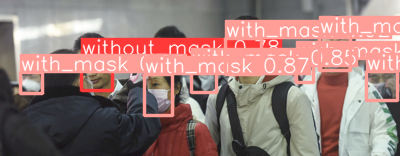

In [ ]:
# Detection result
Image.open('/content/Result/runs/detect/predict/maksssksksss1.png')

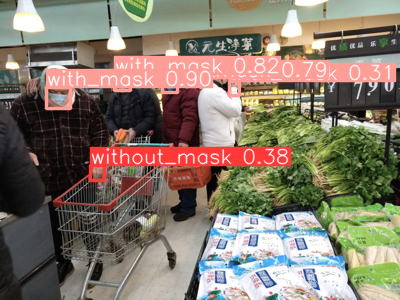

In [ ]:
# Detection result
Image.open('/content/Result/runs/detect/predict/maksssksksss232.png')

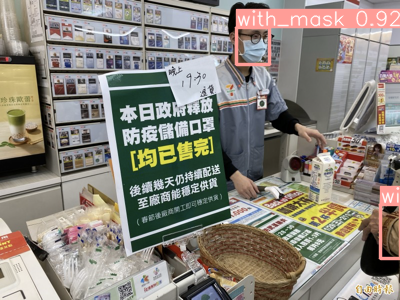

In [ ]:
# Detection result
Image.open('/content/Result/runs/detect/predict/maksssksksss677.png')

In [ ]:
# Download the real-world data
%cd /content
!wget "https://onecms-res.cloudinary.com/image/upload/s--XV7DHKzY--/c_fill,g_auto,h_468,w_830/f_auto,q_auto/people-wearing-mask-at-orchard-road-singapore-feb-3--49-.jpg?itok=GdDk1T6A"

# I check my upload and then change the name of the image I downloaded
if os.path.isfile("/content/people-wearing-mask-at-orchard-road-singapore-feb-3--49-.jpg?itok=GdDk1T6A"):
  os.rename("people-wearing-mask-at-orchard-road-singapore-feb-3--49-.jpg?itok=GdDk1T6A", "image.jpg")

/content

--2023-09-14 13:32:11--  https://onecms-res.cloudinary.com/image/upload/s--XV7DHKzY--/c_fill,g_auto,h_468,w_830/f_auto,q_auto/people-wearing-mask-at-orchard-road-singapore-feb-3--49-.jpg?itok=GdDk1T6A

Resolving onecms-res.cloudinary.com (onecms-res.cloudinary.com)... 151.101.1.137, 151.101.65.137, 151.101.129.137, ...

Connecting to onecms-res.cloudinary.com (onecms-res.cloudinary.com)|151.101.1.137|:443... connected.

HTTP request sent, awaiting response... 200 OK

Length: 44288 (43K) [image/jpeg]

Saving to: ‘people-wearing-mask-at-orchard-road-singapore-feb-3--49-.jpg?itok=GdDk1T6A’



people-wearing-mask 100%[===================>]  43.25K  --.-KB/s    in 0.01s   



2023-09-14 13:32:11 (4.26 MB/s) - ‘people-wearing-mask-at-orchard-road-singapore-feb-3--49-.jpg?itok=GdDk1T6A’ saved [44288/44288]




In [ ]:
# Detection on real-world
%cd /content/Result
!yolo predict model=/content/Result/runs/detect/train/weights/best.pt source='/content/image.jpg'

/content/Result

Ultralytics YOLOv8.0.178 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Model summary (fused): 168 layers, 3006233 parameters, 0 gradients



image 1/1 /content/image.jpg: 384x640 5 without_masks, 2 with_masks, 175.1ms

Speed: 3.0ms preprocess, 175.1ms inference, 145.4ms postprocess per image at shape (1, 3, 384, 640)

Results saved to runs/detect/predict2

💡 Learn more at https://docs.ultralytics.com/modes/predict


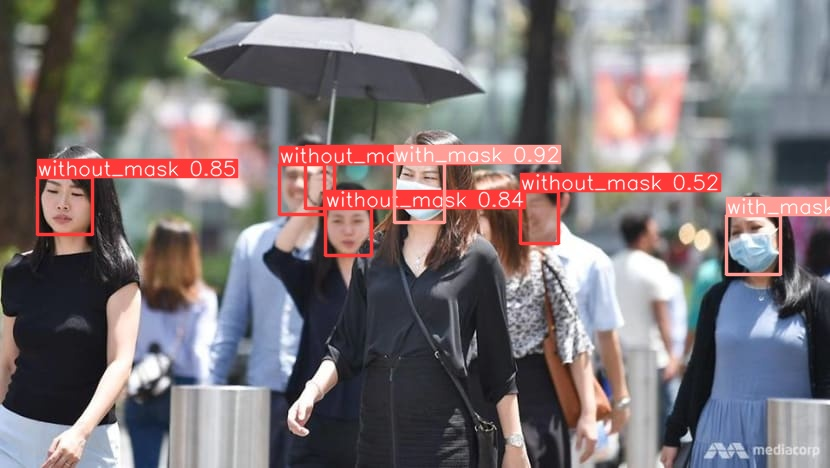

In [ ]:
# Result of detection
Image.open('/content/Result/runs/detect/predict2/image.jpg')

In [ ]:
# Download the real-world data
!wget "https://cloudfront-us-east-2.images.arcpublishing.com/reuters/KPYTVDNVAZIOFDEB2JJN4BHYFU.jpg"

/content

--2023-09-14 13:32:48--  https://cloudfront-us-east-2.images.arcpublishing.com/reuters/KPYTVDNVAZIOFDEB2JJN4BHYFU.jpg

Resolving cloudfront-us-east-2.images.arcpublishing.com (cloudfront-us-east-2.images.arcpublishing.com)... 13.226.22.6, 13.226.22.85, 13.226.22.103, ...

Connecting to cloudfront-us-east-2.images.arcpublishing.com (cloudfront-us-east-2.images.arcpublishing.com)|13.226.22.6|:443... connected.

HTTP request sent, awaiting response... 200 OK

Length: 2072180 (2.0M) [image/jpeg]

Saving to: ‘KPYTVDNVAZIOFDEB2JJN4BHYFU.jpg’



KPYTVDNVAZIOFDEB2JJ 100%[===================>]   1.98M  --.-KB/s    in 0.07s   



2023-09-14 13:32:48 (30.3 MB/s) - ‘KPYTVDNVAZIOFDEB2JJN4BHYFU.jpg’ saved [2072180/2072180]




In [ ]:
# I check my upload and then change the name of the image I downloaded
if os.path.isfile("/content/KPYTVDNVAZIOFDEB2JJN4BHYFU.jpg"):
  os.rename("KPYTVDNVAZIOFDEB2JJN4BHYFU.jpg", "image2.jpg")

In [ ]:
# Detection on real-world)
%cd /content/Result
!yolo predict model=/content/Result/runs/detect/train/weights/best.pt source='/content/image2.jpg'

/content/Result

Ultralytics YOLOv8.0.178 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Model summary (fused): 168 layers, 3006233 parameters, 0 gradients



image 1/1 /content/image2.jpg: 480x640 2 without_masks, 1 with_mask, 52.5ms

Speed: 3.5ms preprocess, 52.5ms inference, 119.2ms postprocess per image at shape (1, 3, 480, 640)

Results saved to runs/detect/predict3

💡 Learn more at https://docs.ultralytics.com/modes/predict


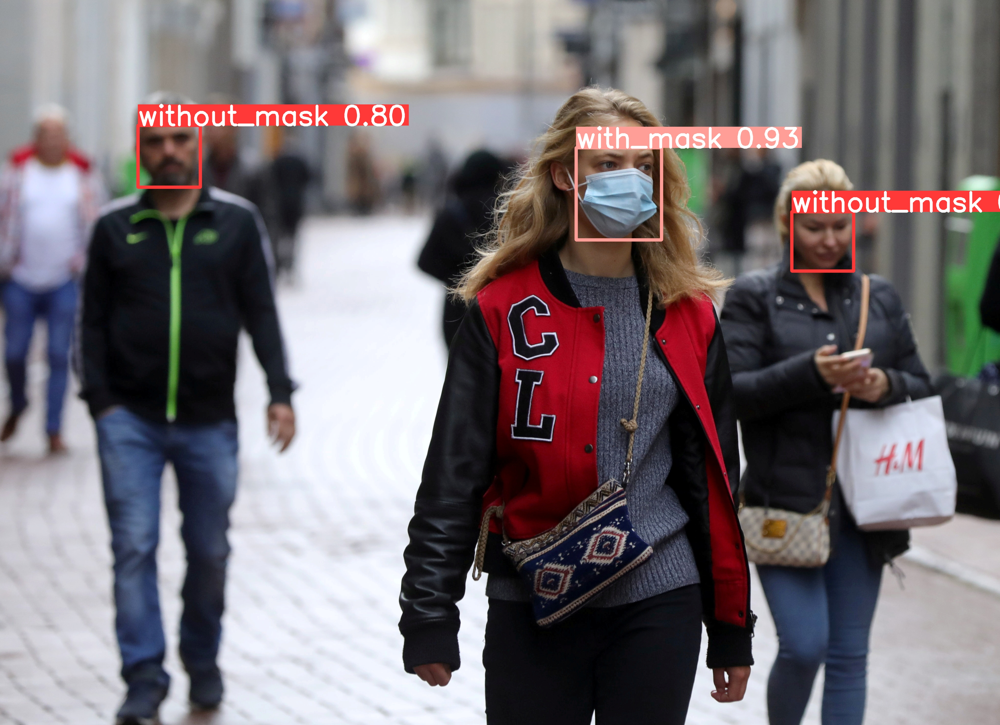

In [ ]:
# Result of detection
Image.open('/content/Result/runs/detect/predict3/image2.jpg')